https://www.kaggle.com/code/gcdatkin/concrete-crack-image-detection/notebook

In [ ]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from pathlib import Path
import os.path

from sklearn.model_selection import train_test_split

import tensorflow as tf

from sklearn.metrics import confusion_matrix, classification_report

In [ ]:
#Import dan Memasukkan Google Drive
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
#Memanggil dataset
image_dir = Path('/content/drive/MyDrive/data_ISIC4')

##Creating DataFrames

In [ ]:
## Get filepaths and labels secara terpisah
filepaths = list(image_dir.glob(r'**/*.[jJ][pP][gG]'))
#alamat images pada direktori
#fungsi glob yg memungkinkan mencari pola di dlm direktori shg kita menemukan apa pun dg format .jpg

In [ ]:
labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))
#fungsi os.path.split untuk membagi nama file dari sisa jalur
#memberi indeks [0] untuk menghilangkan nama file yang seperti 1.jpg
#kemudian untuk mengambil nama label dari nama folder maka gunakan os.path.split lagi
#kemudian diberi indeks [1] untuk hanya mengambil nama label saja.

In [ ]:
filepaths = pd.Series(filepaths, name='Filepath').astype(str)
labels = pd.Series(labels, name='Label')

# Concatenate filepaths and labels
image_df = pd.concat([filepaths, labels], axis=1)

# Sample 200 images from each class
samples = []

for category in image_df['Label'].unique():
    category_slice = image_df.query("Label == @category")
    samples.append(category_slice.sample(300, random_state=1))

image_df = pd.concat(samples, axis=0).sample(frac=1.0, random_state=1).reset_index(drop=True)

In [ ]:
image_df

,Filepath,Label
0,/content/drive/MyDrive/data_ISIC4/malignant/(4...,malignant
1,/content/drive/MyDrive/data_ISIC4/malignant/(1...,malignant
2,/content/drive/MyDrive/data_ISIC4/malignant/(2...,malignant
3,/content/drive/MyDrive/data_ISIC4/malignant/(2...,malignant
4,/content/drive/MyDrive/data_ISIC4/benign/(638)...,benign
...,...,...
895,/content/drive/MyDrive/data_ISIC4/malignant/(4...,malignant
896,/content/drive/MyDrive/data_ISIC4/malignant/(1...,malignant
897,/content/drive/MyDrive/data_ISIC4/Non_tumor/br...,Non_tumor
898,/content/drive/MyDrive/data_ISIC4/Non_tumor/pa...,Non_tumor


In [ ]:
#menghitung jumlah setiap kelas
image_df['Label'].value_counts()

malignant    300
benign       300
Non_tumor    300
Name: Label, dtype: int64

In [ ]:
#membagi train dan test dengan sklearn, menentukan ukuran data train 80%m dengan pengacakan (shuffle)
train_df, test_df = train_test_split(image_df, train_size=0.8, shuffle=True, random_state=1)

##Loading Image Data

In [ ]:
train_gen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    validation_split=0.1
)

test_gen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255
)

#rescale mengubah skala
#ingin memastikan nilai piksel dalam data gambar masuk dalam nilai 0 dan 1,
#sehingga pengkodean standar nilai piksel berada pada skala rgb antara 0 sampai 255,
#0 intensitas warna terendah dan 255 tertinggi.
#1./255 dengan membaginya dengan nilai maksimum atau mengalikan dengan 1 per 255
#pada dasarnya kita memperkecil semua nilai piksel menjadi rentang antara nol dan 1

In [ ]:
train_data = train_gen.flow_from_dataframe(
    train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=64,
    shuffle=True,
    seed=42,
    subset='training'
)

val_data = train_gen.flow_from_dataframe(
    train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=64,
    shuffle=True,
    seed=42,
    subset='validation'
)

test_data = train_gen.flow_from_dataframe(
    test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=64,
    shuffle=False,
    seed=42
)

Found 648 validated image filenames belonging to 3 classes.
Found 72 validated image filenames belonging to 3 classes.
Found 180 validated image filenames belonging to 3 classes.


##Training

In [ ]:
inputs = tf.keras.Input(shape=(224, 224, 3))
#konvolution mengesktrak fiture dari gambar dengan filter/kernel 3x3
x = tf.keras.layers.Conv2D(filters=16, kernel_size=(3, 3), activation='relu')(inputs)
#pooling untuk memperkecil dimensi dengan kernel 2x2
x = tf.keras.layers.MaxPool2D(pool_size=(2, 2))(x)
x = tf.keras.layers.Conv2D(filters=32, kernel_size=(3, 3), activation='relu')(x)
x = tf.keras.layers.MaxPool2D(pool_size=(2, 2))(x)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
outputs = tf.keras.layers.Dense(3, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history = model.fit(
    train_data,
    validation_data=val_data,
    epochs=100,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=3,
            restore_best_weights=True
        )
    ]
)


Epoch 1/100
11/11 [==============================] - 220s 19s/step - loss: 1.1016 - accuracy: 0.3426 - val_loss: 1.0905 - val_accuracy: 0.2778
Epoch 2/100
11/11 [==============================] - 40s 3s/step - loss: 1.0987 - accuracy: 0.3519 - val_loss: 1.0687 - val_accuracy: 0.4722
Epoch 3/100
11/11 [==============================] - 41s 3s/step - loss: 1.0979 - accuracy: 0.3627 - val_loss: 1.0874 - val_accuracy: 0.6250
Epoch 4/100
11/11 [==============================] - 38s 3s/step - loss: 1.0900 - accuracy: 0.3765 - val_loss: 1.0837 - val_accuracy: 0.2778
Epoch 5/100
11/11 [==============================] - 39s 3s/step - loss: 1.0811 - accuracy: 0.3873 - val_loss: 1.0662 - val_accuracy: 0.4861
Epoch 6/100
11/11 [==============================] - 40s 3s/step - loss: 1.0749 - accuracy: 0.4537 - val_loss: 1.0434 - val_accuracy: 0.6111
Epoch 7/100
11/11 [==============================] - 41s 4s/step - loss: 1.0543 - accuracy: 0.5278 - val_loss: 1.0745 - val_accuracy: 0.5000
Epoch 8/100

In [ ]:
print(model.summary())

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 222, 222, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 16)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 32)        0         
 g2D)                                                            
                                                                 
 global_average_pooling2d (  (None, 32)                0     

1/1 [==============================] - 0s 179ms/step


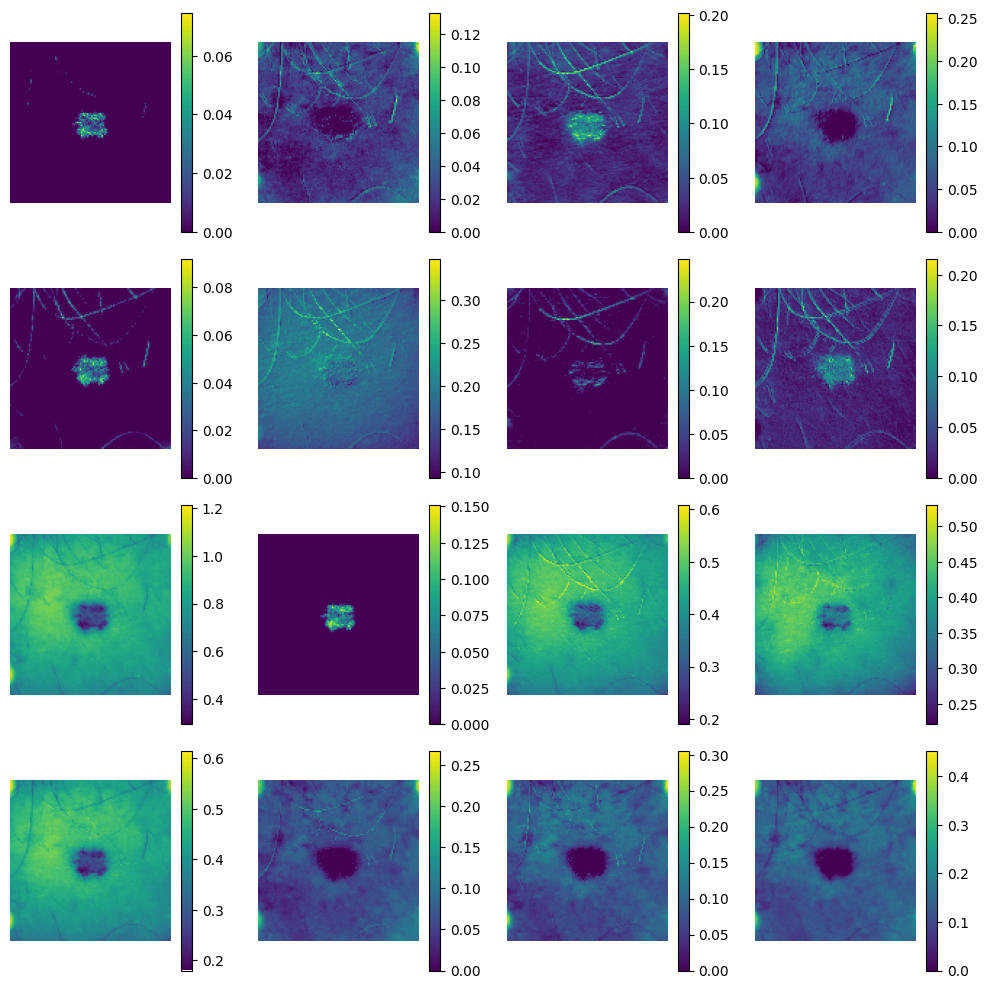

In [ ]:
import matplotlib.pyplot as plt

# Memilih satu contoh gambar dari batch data pelatihan
sample_image, _ = train_data.next()  # Mengambil satu batch gambar pelatihan
sample_image = sample_image[0]  # Mengambil satu gambar dari batch

# Menambahkan dimensi batch karena model membutuhkan input batch
sample_image = np.expand_dims(sample_image, axis=0)

# Membuat model untuk mendapatkan output dari lapisan konvolusi pertama
conv1_layer_model = tf.keras.Model(inputs=model.inputs, outputs=model.layers[2].output)

# Mendapatkan output dari lapisan konvolusi pertama
conv1_output = conv1_layer_model.predict(sample_image)

# Menampilkan hasil konvolusi pertama
plt.figure(figsize=(10, 10))
for i in range(16):  # Menampilkan 16 fitur hasil konvolusi
    plt.subplot(4, 4, i + 1)
    plt.imshow(conv1_output[0, :, :, i], cmap='viridis')  # Menampilkan setiap kanal hasil konvolusi
    plt.axis('off')
    plt.colorbar()
plt.tight_layout()
plt.show()

1/1 [==============================] - 0s 132ms/step
input_1


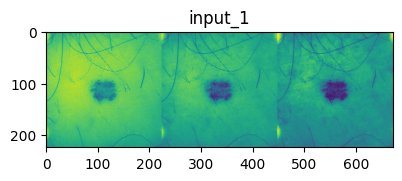

conv2d


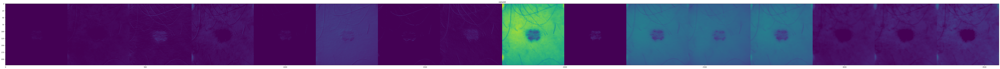

max_pooling2d


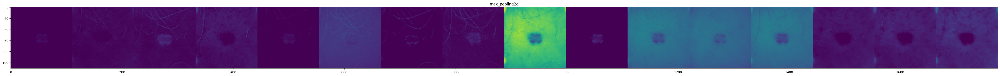

conv2d_1


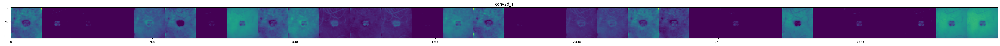

max_pooling2d_1


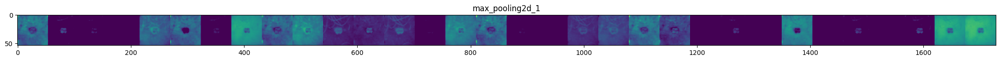

global_average_pooling2d
dense


In [ ]:
# Buat model baru yang menghasilkan keluaran dari setiap lapisan
layer_outputs = [layer.output for layer in model.layers]  # Daftar keluaran dari setiap lapisan
activation_model = tf.keras.models.Model(inputs=model.input, outputs=layer_outputs)

# Ambil contoh gambar untuk divisualisasikan (misalnya gambar pertama dari data pelatihan)
sample_image = train_data[0][0][0:1]  # Ambil satu gambar dari batch pertama
# atau Anda bisa mengambil gambar dari direktori Anda, contoh:
# sample_image = cv2.imread('path_to_your_image.jpg')
# sample_image = cv2.resize(sample_image, (224, 224))
# sample_image = np.expand_dims(sample_image, axis=0)

# Dapatkan keluaran dari setiap lapisan untuk sampel gambar yang dipilih
activations = activation_model.predict(sample_image)

# Visualisasikan hasil dari setiap lapisan
layer_names = [layer.name for layer in model.layers]

for layer_name, layer_activation in zip(layer_names, activations):
    print(layer_name)
    if len(layer_activation.shape) == 4:
        n_features = layer_activation.shape[-1]  # Jumlah fitur dalam lapisan
        size = layer_activation.shape[1]  # Ukuran gambar dalam lapisan (asumsi persegi)
        display_grid = np.zeros((size, size * n_features))
        for i in range(n_features):
            channel_image = layer_activation[0, :, :, i]
            display_grid[:, i * size : (i + 1) * size] = channel_image
        plt.figure(figsize=(size / 2, n_features / 2))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(display_grid, cmap='viridis')
    plt.show()


Saving (15).JPG to (15).JPG
1/1 [==============================] - 0s 168ms/step
input_1


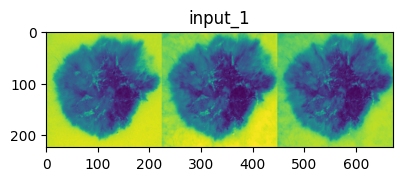

conv2d


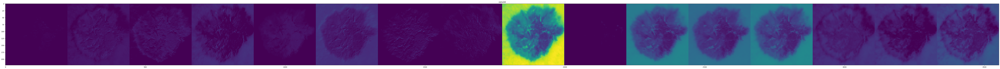

max_pooling2d


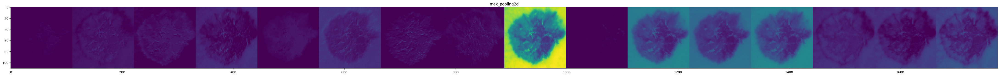

conv2d_1


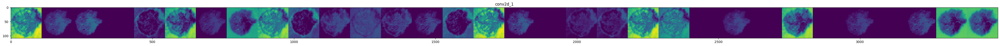

max_pooling2d_1


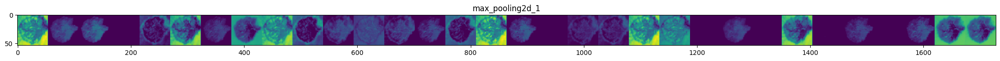

global_average_pooling2d
dense


In [ ]:
# Buat model baru yang menghasilkan keluaran dari setiap lapisan
layer_outputs = [layer.output for layer in model.layers]  # Daftar keluaran dari setiap lapisan
activation_model = tf.keras.models.Model(inputs=model.input, outputs=layer_outputs)

# atau Anda bisa mengambil gambar dari direktori Anda, contoh:
# Import library yang diperlukan
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import resize
from google.colab import files

# Upload gambar
uploaded = files.upload()
file_name = list(uploaded.keys())[0]

# Baca dan ubah ukuran gambar
new_image = plt.imread(file_name)
resized_image = resize(new_image, (224, 224, 3))
sample_image = np.expand_dims(resized_image, axis=0)

# Dapatkan keluaran dari setiap lapisan untuk sampel gambar yang dipilih
activations = activation_model.predict(sample_image)

# Visualisasikan hasil dari setiap lapisan
layer_names = [layer.name for layer in model.layers]

for layer_name, layer_activation in zip(layer_names, activations):
    print(layer_name)
    if len(layer_activation.shape) == 4:
        n_features = layer_activation.shape[-1]  # Jumlah fitur dalam lapisan
        size = layer_activation.shape[1]  # Ukuran gambar dalam lapisan (asumsi persegi)
        display_grid = np.zeros((size, size * n_features))
        for i in range(n_features):
            channel_image = layer_activation[0, :, :, i]
            display_grid[:, i * size : (i + 1) * size] = channel_image
        plt.figure(figsize=(size / 2, n_features / 2))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(display_grid, cmap='viridis')
    plt.show()


In [ ]:
#Menampilkan nilai matriks gambar

# Import library yang diperlukan
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import resize
from google.colab import files

# Upload gambar
uploaded = files.upload()
file_name = list(uploaded.keys())[0]

# Baca dan ubah ukuran gambar
new_image = plt.imread(file_name)
resized_image = resize(new_image, (224, 224, 3))

# Konversi gambar menjadi array NumPy
image_array = np.array(resized_image)

# Pisahkan masing-masing channel (merah, hijau, dan biru)
red_channel = image_array[:, :, 0]
green_channel = image_array[:, :, 1]
blue_channel = image_array[:, :, 2]

# Menampilkan nilai-nilai dalam matriks gambar secara terstruktur dan rapi
print("Nilai-nilai dalam matriks gambar (Channel Merah):")
for i in range(224):
    print("|", end="")
    for j in range(224):
        print(f"{red_channel[i][j]:.1f}", end="\t")
    print("|")

print("\nNilai-nilai dalam matriks gambar (Channel Hijau):")
for i in range(224):
    print("|", end="")
    for j in range(224):
        print(f"{green_channel[i][j]:.1f}", end="\t")
    print("|")

print("\nNilai-nilai dalam matriks gambar (Channel Biru):")
for i in range(224):
    print("|", end="")
    for j in range(224):
        print(f"{blue_channel[i][j]:.1f}", end="\t")
    print("|")


Saving (15).JPG to (15) (1).JPG
Nilai-nilai dalam matriks gambar (Channel Merah):
|0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	0.8	|
|0.8	0.8	0.8	0.8	0.

In [ ]:
import plotly.express as px

# Buat plot menggunakan Plotly Express
fig = px.line(
    history.history,
    y=['accuracy', 'val_accuracy'],
    labels={'index': "Epoch", 'value': "Accuracy"},
    title="Training and Validation Accuracy Over Time"
)

# Mengubah nama legenda
fig.data[0].name = 'Akurasi Data Train'
fig.data[1].name = 'Akurasi Data Validasi'

fig.show()

In [ ]:
fig = px.line(
    history.history,
    y=['loss', 'val_loss'],
    labels={'index': "Epoch", 'value': "Loss"},
    title="Training and Validation Loss Over Time"
)

# Mengubah nama legenda
fig.data[0].name = 'Loss Data Train'
fig.data[1].name = 'Loss Data Validasi'

fig.show()

##Result

In [ ]:
results = model.evaluate(test_data, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.85343
Test Accuracy: 61.67%


##Confussion Matrix

3/3 [==============================] - 6s 2s/step
    Test Loss: 0.85343
Test Accuracy: 61.67%


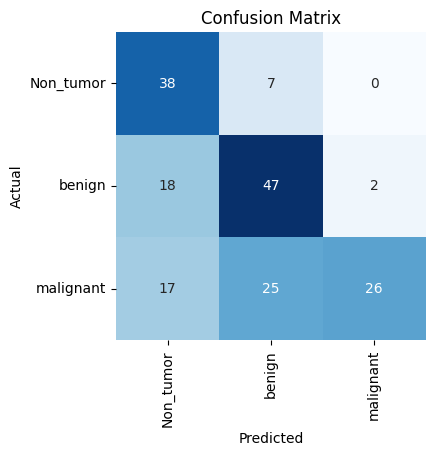

Classification Report:
----------------------
               precision    recall  f1-score   support

   Non_tumor       0.52      0.84      0.64        45
      benign       0.59      0.70      0.64        67
   malignant       0.93      0.38      0.54        68

    accuracy                           0.62       180
   macro avg       0.68      0.64      0.61       180
weighted avg       0.70      0.62      0.61       180



In [ ]:
results = model.evaluate(test_data, verbose=0)
#prediksi model
#argmax untuk mengmbil lokasi mana dengan probabilitas tertinggi atau indeks mana yg akan menjadi kelas
predictions = np.argmax(model.predict(test_data), axis=1)

#nama kelas berasal dari test images
class_names = list(test_data.class_indices.keys())

cm = confusion_matrix(test_data.labels, predictions, labels=np.arange(3))
clr = classification_report(test_data.labels, predictions, labels=np.arange(3), target_names=class_names)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

plt.figure(figsize=(4, 4))
sns.heatmap(cm, annot=True, fmt='g', vmin=0, cmap='Blues', cbar=False)
#fmt=g' ==> mencegah erhitungan klasifikasi muncul sebagai notasi ilmiah, menginginkan dalam bil.bulat
#vim=0 ==> nilai warna minimum 0
#cmap='Blues' ==> peta warna biru
#cbar=False ==> mematikan bilah warna
plt.xticks(ticks=np.arange(3) + 0.5, labels=class_names, rotation=90)
plt.yticks(ticks=np.arange(3) + 0.5, labels=class_names, rotation=0)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

print("Classification Report:\n----------------------\n", clr)